<a href="https://colab.research.google.com/github/pachterlab/CWGFLHGCCHAP_2021/blob/master/notebooks/Preprocessing/ClickTagDemultiplexing/kallistobusStarvClickTags.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!date

### **Download Data**

In [ ]:
#Install kallisto and bustools

!wget --quiet https://github.com/pachterlab/kallisto/releases/download/v0.46.2/kallisto_linux-v0.46.2.tar.gz
!tar -xf kallisto_linux-v0.46.2.tar.gz
!cp kallisto/kallisto /usr/local/bin/

!wget --quiet https://github.com/BUStools/bustools/releases/download/v0.40.0/bustools_linux-v0.40.0.tar.gz
!tar -xf bustools_linux-v0.40.0.tar.gz
!cp bustools/bustools /usr/local/bin/

In [ ]:
import requests
from tqdm import tnrange, tqdm_notebook
def download_file(doi,ext):
    url = 'https://api.datacite.org/dois/'+doi+'/media'
    r = requests.get(url).json()
    netcdf_url = r['data'][0]['attributes']['url']
    r = requests.get(netcdf_url,stream=True)
    #Set file name
    fname = doi.split('/')[-1]+ext
    #Download file with progress bar
    if r.status_code == 403:
        print("File Unavailable")
    if 'content-length' not in r.headers:
        print("Did not get file")
    else:
        with open(fname, 'wb') as f:
            total_length = int(r.headers.get('content-length'))
            pbar = tnrange(int(total_length/1024), unit="B")
            for chunk in r.iter_content(chunk_size=1024):
                if chunk:
                    pbar.update()
                    f.write(chunk)
        return fname

In [ ]:
# Get ClickTag Barcodes/Sequences
download_file('10.22002/D1.1831','.gz')

#All ClickTag MiSeq fastqs
download_file('10.22002/D1.1856','.tar.gz')

# jelly3tags1counts.csv
download_file('10.22002/D1.1799','.gz')

# jelly3tags2counts.csv
download_file('10.22002/D1.1800','.gz')

# cellRanger fs/h5ad
download_file('10.22002/D1.1798','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1798.gz'

In [ ]:
!tar -xf D1.1856.tar.gz


In [ ]:
!gunzip D1.1831.gz D1.1799.gz D1.1800.gz D1.1798.gz

In [ ]:
!pip install --quiet anndata
!pip install --quiet scanpy==1.6.0
!pip install --quiet louvain
!pip3 install --quiet biopython

     |████████████████████████████████| 122kB 4.9MB/s 
     |████████████████████████████████| 10.2MB 4.5MB/s 
     |████████████████████████████████| 71kB 6.9MB/s 
     |████████████████████████████████| 51kB 4.9MB/s 
     |████████████████████████████████| 2.2MB 6.9MB/s 
     |████████████████████████████████| 3.2MB 45.3MB/s 
     |████████████████████████████████| 2.3MB 5.0MB/s 


### **Import Packages**

In [ ]:
import pandas as pd
import copy
from sklearn.preprocessing import LabelEncoder
from scipy import sparse
import scipy
import numpy as np
import anndata
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

from collections import OrderedDict
from Bio import SeqIO
import os
from scipy import io
import scipy.io as sio
import time


%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### **Quantify ClickTags with kallisto-bustools for Selecting High-Quality (Tagged) Cells**

Create map of all ClickTag barcodes and sequences Hamming distance 1 away from these barcodes

In [ ]:
## Set parameters - below are parameters for 10x 3' v2 chemistry
## The cell hashing method uses tags of length 12, we included the variable B (T,C,G) in the end to make it lenght 13
cell_barcode_length = 16
UMI_length = 12
sample_tag_length=11

"""
This function returns all sample tags and and their single base mismatches (hamming distance 1).
ClickTag sequences are provided as a fasta file, and the script indexes the barcode region of the fasta
"""

"parse the tags file and output the set of tag sequences"

def parse_tags(filename):
    odict = OrderedDict()
    print('Read the following tags:')
    for record in SeqIO.parse(filename, "fasta"):
        counter=0
        print(record.seq)
        odict[record.name] = str(record.seq)[26:26+sample_tag_length]
        for pos in range(sample_tag_length):
            letter =str(record.seq)[26+pos]
            barcode=list(str(record.seq)[26:26+sample_tag_length])
            if letter=='A':
                barcode[pos]='T'
                odict[record.name+'-'+str(pos)+'-1'] = "".join(barcode)
                barcode[pos]='G'
                odict[record.name+'-'+str(pos)+'-2'] = "".join(barcode)
                barcode[pos]='C'
                odict[record.name+'-'+str(pos)+'-3'] = "".join(barcode)
            elif letter=='G':
                barcode[pos]='T'
                odict[record.name+'-'+str(pos)+'-1'] = "".join(barcode)
                barcode[pos]='A'
                odict[record.name+'-'+str(pos)+'-2'] = "".join(barcode)
                barcode[pos]='C'
                odict[record.name+'-'+str(pos)+'-3'] = "".join(barcode)
            elif letter=='C':
                barcode[pos]='T'
                odict[record.name+'-'+str(pos)+'-1'] = "".join(barcode)
                barcode[pos]='G'
                odict[record.name+'-'+str(pos)+'-2'] = "".join(barcode)
                barcode[pos]='A'
                odict[record.name+'-'+str(pos)+'-3'] = "".join(barcode)
            else:
                barcode[pos]='A'
                odict[record.name+'-'+str(pos)+'-1'] = "".join(barcode)
                barcode[pos]='G'
                odict[record.name+'-'+str(pos)+'-2'] = "".join(barcode)
                barcode[pos]='C'
                odict[record.name+'-'+str(pos)+'-3'] = "".join(barcode)
                
    return odict

In [ ]:
# Make kallisto index from ClickTag sequences

!mv D1.1831 70BPbarcodes.fa
tags_file_path = ("70BPbarcodes.fa") #70BPbarcodes.fa
tag_map=parse_tags(tags_file_path)


work_folder = ''
data_folder = ''
write_folder = ''

#Write the list of barcodes as a fasta, then make a kallisto index
!mkdir barcode_corrected_tags
tagmap_file_path = "barcode_corrected_tags/70BPbarcodes_tagmap.fa"

tagmap_file = open(tagmap_file_path, "w+")
for i in list(tag_map.keys()):
    tagmap_file.write(">" + i + "\n" +tag_map[i] + "\n")
tagmap_file.close()

!kallisto index -i {tagmap_file_path}.idx -k 11 {tagmap_file_path}
!kallisto inspect {tagmap_file_path}.idx

Read the following tags:
CTGGGTCGTCGGCAGCGTCAGATGTGTAAGCAGTTACAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTACTTGTACCCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTAGAACCCGGCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTATCGTAGATCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTAACGCGGAACAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTACGCTATCCCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTAGTTGCATGCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTATAAATCGTCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTAATCGCCATCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTACATAAAGGCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTATCACGGTACAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTACACTCAACCAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTAGCTGTGTACAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
CTGGGTCGTCGGCAGCGTCAGATGTGTATTGCGTCGCAGAAAAAAAAAAAAA

Quantify ClickTags with kallisto bustools and barcode whitelist

In [ ]:
#Run kallisto bus on ClickTag fastqs

!mkdir jelly3fedstarved_1_tags_HiSeq
write_folder = 'jelly3fedstarved_1_tags_HiSeq'

R1_1='Jelly3tags1_S1_L001_R1_001.fastq.gz'
R2_1='Jelly3tags1_S1_L001_R2_001.fastq.gz'

!kallisto bus -i {tagmap_file_path}.idx -o {write_folder} -x 10xv2 -t 20 {R1_1} {R2_1}

#sort bus file
!bustools sort -o {os.path.join(write_folder,'output_sorted.bus')} {os.path.join(write_folder,'output.bus')}

# convert the sorted busfile to txt
!bustools text -o {os.path.join(write_folder,'output_sorted.txt')} {os.path.join(write_folder,'output_sorted.bus')}


!mkdir jelly3fedstarved_2_tags_HiSeq
write_folder = 'jelly3fedstarved_2_tags_HiSeq'

R1_2='Jelly3tags2_S2_L001_R1_001.fastq.gz'
R2_2='Jelly3tags2_S2_L001_R2_001.fastq.gz'

!kallisto bus -i {tagmap_file_path}.idx -o {write_folder} -x 10xv2 -t 20 {R1_2} {R2_2}

#sort bus file
!bustools sort -o {os.path.join(write_folder,'output_sorted.bus')} {os.path.join(write_folder,'output.bus')}

# convert the sorted busfile to txt
!bustools text -o {os.path.join(write_folder,'output_sorted.txt')} {os.path.join(write_folder,'output_sorted.bus')}


[index] k-mer length: 11
[index] number of targets: 680
[index] number of k-mers: 680
[index] number of equivalence classes: 680
[quant] will process sample 1: Jelly3tags1_S1_L001_R1_001.fastq.gz
                               Jelly3tags1_S1_L001_R2_001.fastq.gz
[quant] finding pseudoalignments for the reads ... done
[quant] processed 11,225,060 reads, 10,004,853 reads pseudoaligned

Read in 10004853 BUS records
Read in 9946557 BUS records

[index] k-mer length: 11
[index] number of targets: 680
[index] number of k-mers: 680
[index] number of equivalence classes: 680
[quant] will process sample 1: Jelly3tags2_S2_L001_R1_001.fastq.gz
                               Jelly3tags2_S2_L001_R2_001.fastq.gz
[quant] finding pseudoalignments for the reads ... done
[quant] processed 10,090,654 reads, 8,879,356 reads pseudoaligned

Read in 8879356 BUS records
Read in 8826794 BUS records


In [ ]:
write_folder = '' 

bus_data_jelly1 = pd.read_csv(os.path.join(write_folder,'jelly3fedstarved_1_tags_HiSeq/output_sorted.txt'), delimiter='\t', header=None, names = ['barcode', 'umi', 'tag_eqclass', 'multiplicity'])
bus_data_jelly1.head()

bus_data_jelly1

bus_data_jelly2 = pd.read_csv(os.path.join(write_folder,'jelly3fedstarved_2_tags_HiSeq/output_sorted.txt'), delimiter='\t', header=None, names = ['barcode', 'umi', 'tag_eqclass', 'multiplicity'])
bus_data_jelly2.head()

tag_map_df = pd.DataFrame.from_dict(tag_map, orient = 'index').reset_index()
tag_map_df.columns=['tagname','tagseq']
tag_map_df['ClickTag'] = tag_map_df['tagname'].str.split('-').str.get(0)
tag_map_df.head()

bus_data_jelly1['tag']= bus_data_jelly1['tag_eqclass'].map(tag_map_df['ClickTag'])
bus_data_jelly1.head()

bus_data_jelly2['tag']= bus_data_jelly2['tag_eqclass'].map(tag_map_df['ClickTag'])
bus_data_jelly2.head()



print('Counting UMIs')
counted_data_jelly1 = bus_data_jelly1.groupby(['barcode', 'tag'])['umi'].count().reset_index()
counted_data_jelly1.rename(columns={'umi':'umi_counts'}, inplace = True)
counted_data_jelly1.head()

print('Counting UMIs')
counted_data_jelly2 = bus_data_jelly2.groupby(['barcode', 'tag'])['umi'].count().reset_index()
counted_data_jelly2.rename(columns={'umi':'umi_counts'}, inplace = True)
counted_data_jelly2.head()

Counting UMIs
Counting UMIs


,barcode,tag,umi_counts
0,AAAAAAAAAAAAAAAA,BC_23,1
1,AAAAAAAAAAAAAAAA,BC_32,1
2,AAAAAAAAAAAAAAAA,BC_34,1
3,AAAAAAAAAAAAAAAA,BC_40,1
4,AAAAAAAAAAAAAAAC,BC_34,1


In [ ]:
!mkdir counted_tag_data

In [ ]:
data_dict={'counted_data_jelly1':counted_data_jelly1, 'counted_data_jelly2':counted_data_jelly2}
counted_data_jelly1['barcode']=[x+'-1' for x in counted_data_jelly1['barcode'].values]
counted_data_jelly2['barcode']=[x+'-2' for x in counted_data_jelly2['barcode'].values]



for counted_data in data_dict:

    le_barcode = LabelEncoder()
    barcode_idx =le_barcode.fit_transform(data_dict[counted_data]['barcode'].values)
    print('Barcode index shape:', barcode_idx.shape)

    le_umi = LabelEncoder()
    umi_idx = le_umi.fit_transform(data_dict[counted_data]['umi_counts'].values)
    print('UMI index shape:', umi_idx.shape)

    le_tag = LabelEncoder()
    tag_idx = le_tag.fit_transform(data_dict[counted_data]['tag'].values)
    print('Tag index shape:', tag_idx.shape)
    
    # convert data to csr matrix
    csr_matrix_data = scipy.sparse.csr_matrix((data_dict[counted_data]['umi_counts'].values,(barcode_idx,tag_idx)))
    
    
    scipy.io.mmwrite(os.path.join(write_folder,'counted_tag_data/' + counted_data + '.mtx'),csr_matrix_data)
    print('Saved sparse csr matrix')
    
    pd.DataFrame(le_tag.classes_).to_csv(os.path.join(write_folder,'counted_tag_data/' + counted_data + '_ClickTag_tag_labels.csv'), index = False, header = False)
    pd.DataFrame(le_barcode.classes_).to_csv(os.path.join(write_folder,'counted_tag_data/' + counted_data + '_ClickTag_barcode_labels.csv'), index = False, header = False)
    print('Saved cell barcode and hashtag labels')
    print('Number of unique cell barcodes seen:', len(le_barcode.classes_))

Barcode index shape: (2019238,)
UMI index shape: (2019238,)
Tag index shape: (2019238,)
Saved sparse csr matrix
Saved cell barcode and hashtag labels
Number of unique cell barcodes seen: 463514
Barcode index shape: (1836152,)
UMI index shape: (1836152,)
Tag index shape: (1836152,)
Saved sparse csr matrix
Saved cell barcode and hashtag labels
Number of unique cell barcodes seen: 425169


In [ ]:
# Clicktag for both 10x lanes concatenated

ClickTagCountsmat=scipy.io.mmread(os.path.join(write_folder,'counted_tag_data/counted_data_jelly1.mtx'))
ClickTagCounts=pd.DataFrame(ClickTagCountsmat.toarray(), 
                            index=list(pd.read_csv(os.path.join(write_folder,'counted_tag_data/counted_data_jelly1_ClickTag_barcode_labels.csv'), header=None).loc[:,0]),
                            columns=list(pd.read_csv(os.path.join(write_folder,'counted_tag_data/' + counted_data + '_ClickTag_tag_labels.csv'), header=None).loc[:,0]))

ClickTagCountsmat=scipy.io.mmread(os.path.join(write_folder,'counted_tag_data/counted_data_jelly2.mtx'))
ClickTagCounts=ClickTagCounts.append(pd.DataFrame(ClickTagCountsmat.toarray(), 
                            index=list(pd.read_csv(os.path.join(write_folder,'counted_tag_data/counted_data_jelly2_ClickTag_barcode_labels.csv'), header=None).loc[:,0]),
                            columns=list(pd.read_csv(os.path.join(write_folder,'counted_tag_data/' + counted_data + '_ClickTag_tag_labels.csv'), header=None).loc[:,0])))


ClickTagCounts

,BC_21,BC_22,BC_23,BC_24,BC_25,BC_26,BC_27,BC_28,BC_29,BC_30,BC_31,BC_32,BC_33,BC_34,BC_35,BC_36,BC_37,BC_38,BC_39,BC_40
AAAAAAAAAAAAAAAA-1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
AAAAAAAAAAAAAAAC-1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
AAAAAAAAAAAAAAAG-1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
AAAAAAAAAAAAAAAT-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
AAAAAAAAAAAAAATT-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTGTCGAAGCGCG-2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
TTTTTGTGTGCCTGAG-2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
TTTTTTACCTTTAGAC-2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
TTTTTTAGGTGGTCCG-2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


Use knee-plot to set cutoff for real cells with high-quality ClickTags

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


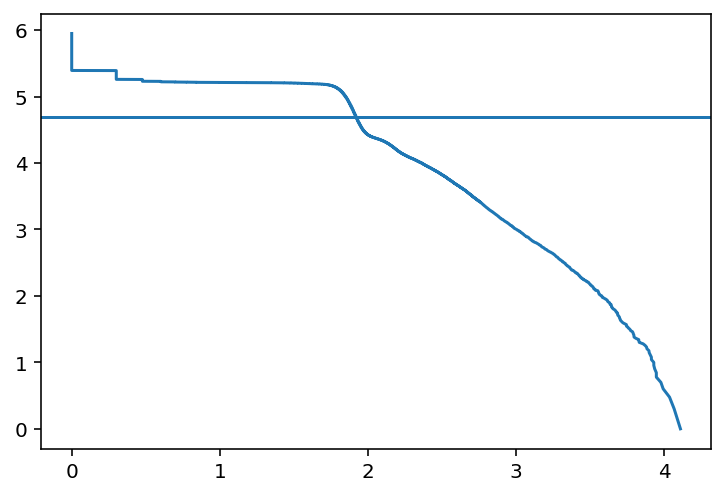

In [ ]:
ClickTag_counts_sorted = copy.deepcopy(ClickTagCounts.T.sum())
ClickTag_counts_sorted = ClickTag_counts_sorted.sort_values(ascending=False)
plt.plot(ClickTag_counts_sorted.apply(np.log10),np.log10(range(len(ClickTag_counts_sorted))))
plt.axhline(np.log10(50000))
plt.show()

In [ ]:
ClickTag_counts_filtered=ClickTagCounts.loc[list(ClickTag_counts_sorted[:50000].index)]
filtered_ClickTag_counts=ClickTag_counts_filtered.T
filtered_ClickTag_counts



hits = 0
counter = 1
for barcode in filtered_ClickTag_counts.index:
    for i in filtered_ClickTag_counts:    
        if filtered_ClickTag_counts[i].idxmax() == barcode:
            if hits ==0:
                sortedheatmap_dtf=pd.DataFrame({counter:filtered_ClickTag_counts[i]})
                hits+=1
                counter+=1
            else:
               sortedheatmap_dtf = sortedheatmap_dtf.assign(i = filtered_ClickTag_counts[i])
               sortedheatmap_dtf.rename(columns = {'i':counter}, inplace = True)
               counter+=1

filtered_ClickTag_counts=copy.deepcopy(sortedheatmap_dtf)

percentClickTags_counts = copy.deepcopy(filtered_ClickTag_counts)
for i in filtered_ClickTag_counts:
        percentClickTags_counts[i] = filtered_ClickTag_counts[i]/filtered_ClickTag_counts[i].sum()

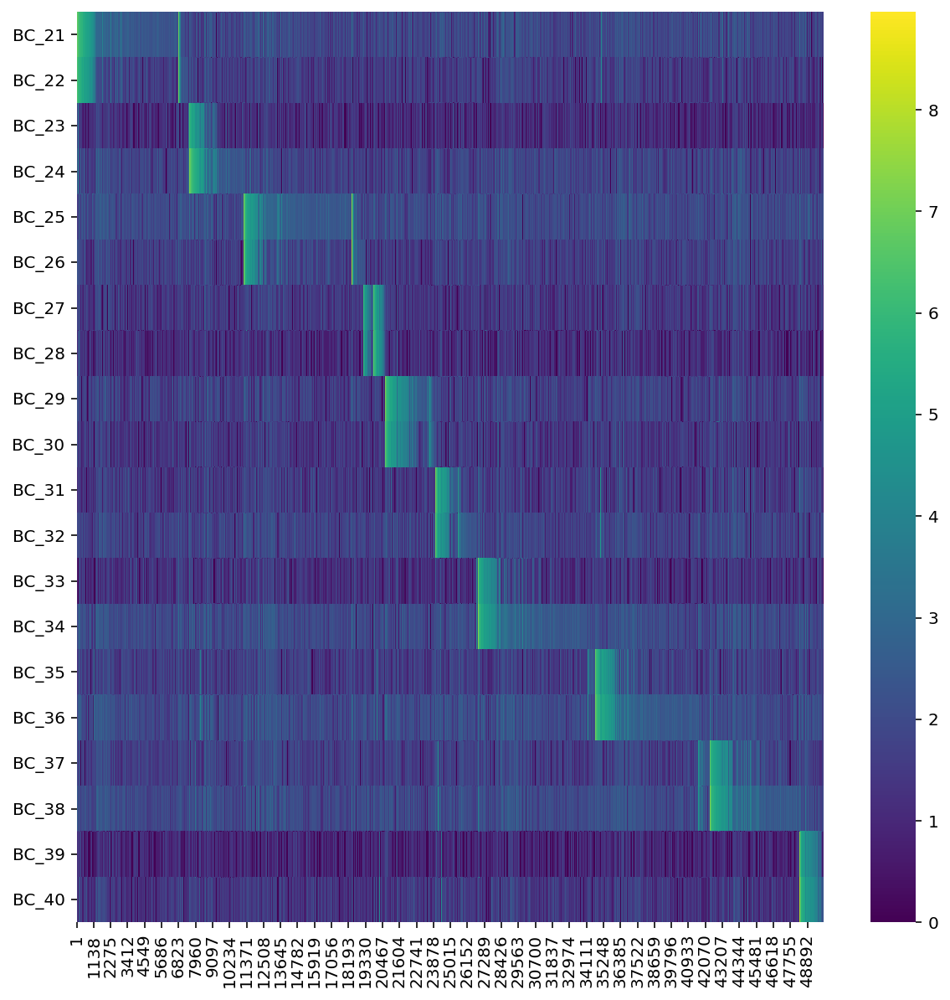

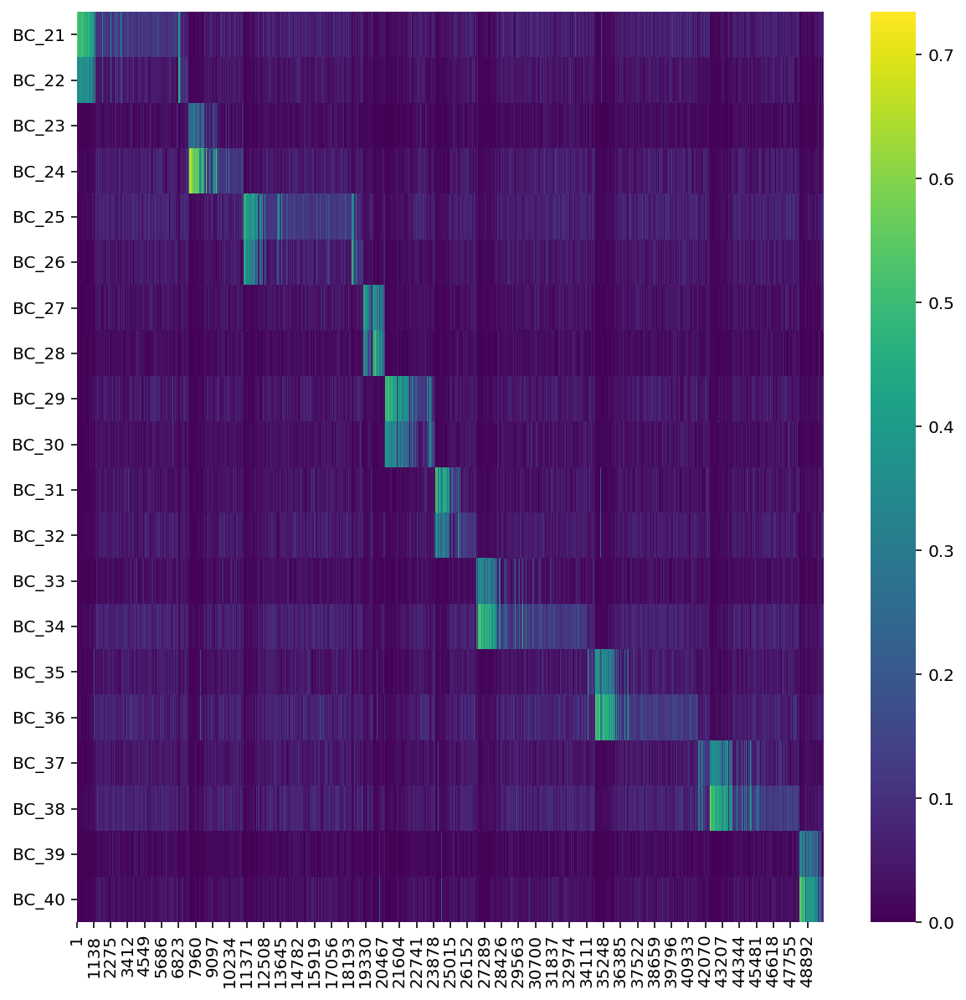

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,...,49961,49962,49963,49964,49965,49966,49967,49968,49969,49970,49971,49972,49973,49974,49975,49976,49977,49978,49979,49980,49981,49982,49983,49984,49985,49986,49987,49988,49989,49990,49991,49992,49993,49994,49995,49996,49997,49998,49999,50000
BC_21,4838,4466,4020,4029,3849,3388,3145,3134,3080,2732,2187,2348,1854,2130,2027,1845,1950,2160,1688,1762,1713,1578,1426,1373,1460,1484,1466,1264,1365,1427,1209,1335,1128,1257,1204,1084,1140,909,1164,1273,...,3,7,7,7,7,3,4,3,3,2,5,7,1,7,2,5,8,7,6,5,3,5,3,3,8,3,4,6,5,7,5,4,8,3,0,4,6,4,4,4
BC_22,3502,3433,3298,3142,3095,2532,2738,2227,2242,2120,2052,1842,1771,1534,1609,1609,1436,1131,1468,1351,1220,1260,1368,1249,1142,1145,1131,960,1099,1029,1075,860,1036,950,976,992,972,531,932,827,...,1,7,4,4,4,4,1,4,2,5,1,2,2,1,2,3,4,5,0,3,4,6,1,2,5,6,4,3,3,2,1,7,1,3,2,2,4,4,2,2
BC_23,9,10,10,10,9,12,13,3,7,13,4,8,4,5,6,7,5,8,7,2,8,6,2,6,2,1,3,2,3,3,1,5,3,1,5,0,7,171,1,3,...,1,4,0,3,3,1,3,2,2,2,1,1,2,2,4,2,0,0,3,4,3,0,0,0,1,0,3,3,5,2,0,2,0,0,1,2,3,1,3,4
BC_24,25,25,22,18,17,22,19,26,16,23,19,10,8,17,15,11,13,15,6,14,10,6,12,14,21,11,7,10,8,14,5,2,5,6,14,13,13,472,9,9,...,2,8,2,4,5,6,3,6,4,0,2,3,5,5,1,8,5,4,4,6,7,6,3,5,5,3,3,7,4,2,4,6,4,6,4,3,6,2,3,7
BC_25,31,29,22,27,30,35,30,24,13,25,20,12,23,19,13,15,13,19,20,13,17,10,18,13,22,11,9,11,11,16,18,17,15,13,10,14,10,24,7,11,...,4,3,5,5,4,6,4,3,5,5,1,4,6,8,2,4,4,7,5,4,5,8,2,4,5,1,6,3,7,5,5,5,3,3,8,3,8,6,5,7
BC_26,30,23,23,19,29,20,21,20,20,18,9,18,16,8,10,10,11,9,10,17,14,11,15,14,12,13,17,9,13,10,9,8,10,9,8,14,10,16,13,10,...,2,5,8,0,4,4,2,5,2,6,1,4,4,3,0,6,5,4,3,2,1,6,0,4,2,9,8,7,5,4,2,4,3,3,3,5,4,6,3,3
BC_27,15,19,10,17,11,7,10,8,17,13,10,14,14,6,8,12,5,7,12,12,6,7,2,11,11,10,12,9,11,3,9,1,10,6,6,7,1,10,4,4,...,0,1,9,4,3,1,2,0,2,1,2,3,2,0,4,2,4,2,7,2,4,2,3,3,1,0,1,1,4,0,6,4,3,2,0,4,4,5,7,4
BC_28,19,12,15,14,17,9,12,10,13,5,10,9,12,8,7,5,5,6,6,10,6,4,4,1,5,8,8,3,6,4,10,5,3,2,2,12,7,6,6,9,...,1,0,1,5,2,6,1,0,1,2,0,1,2,5,1,1,3,2,5,3,0,1,2,2,6,1,1,1,1,2,0,1,1,0,1,1,0,3,2,2
BC_29,9,21,22,19,13,14,14,12,20,22,12,11,10,10,12,11,10,12,15,11,13,8,12,8,10,7,11,9,9,10,8,13,9,7,6,16,10,6,11,6,...,1,7,3,4,8,3,4,15,1,4,2,4,7,8,3,6,3,4,3,1,3,4,0,7,6,6,4,3,4,4,3,1,9,3,9,2,4,4,4,3
BC_30,13,5,17,9,13,12,11,7,5,10,11,9,6,3,5,4,8,4,7,6,8,5,9,7,6,6,7,7,5,4,6,8,5,5,4,12,4,2,9,1,...,5,2,1,2,1,2,2,13,4,3,2,0,3,3,1,3,2,2,2,3,3,5,2,4,1,2,2,2,2,0,4,3,6,2,7,7,5,6,0,3


In [ ]:
fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(np.log1p(filtered_ClickTag_counts), cmap='viridis')
plt.show()

fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(percentClickTags_counts, cmap='viridis')
plt.show()

filtered_ClickTag_counts

In [ ]:
adata = sc.AnnData(ClickTag_counts_filtered)
adata.var_names= list(ClickTag_counts_filtered.columns)
adata.obs_names= list(ClickTag_counts_filtered[:50000].index)

In [ ]:
adata

AnnData object with n_obs × n_vars = 50000 × 20

Cluster ClickTag counts to determine high quality cells (cells strongly marked by the assigned barcodes)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


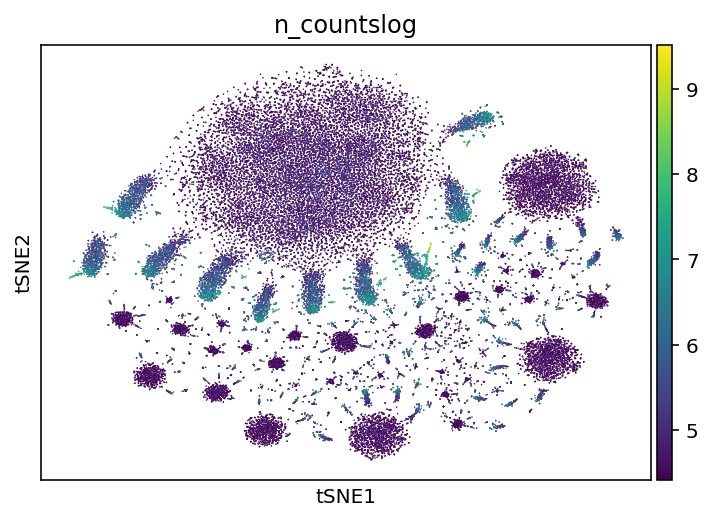

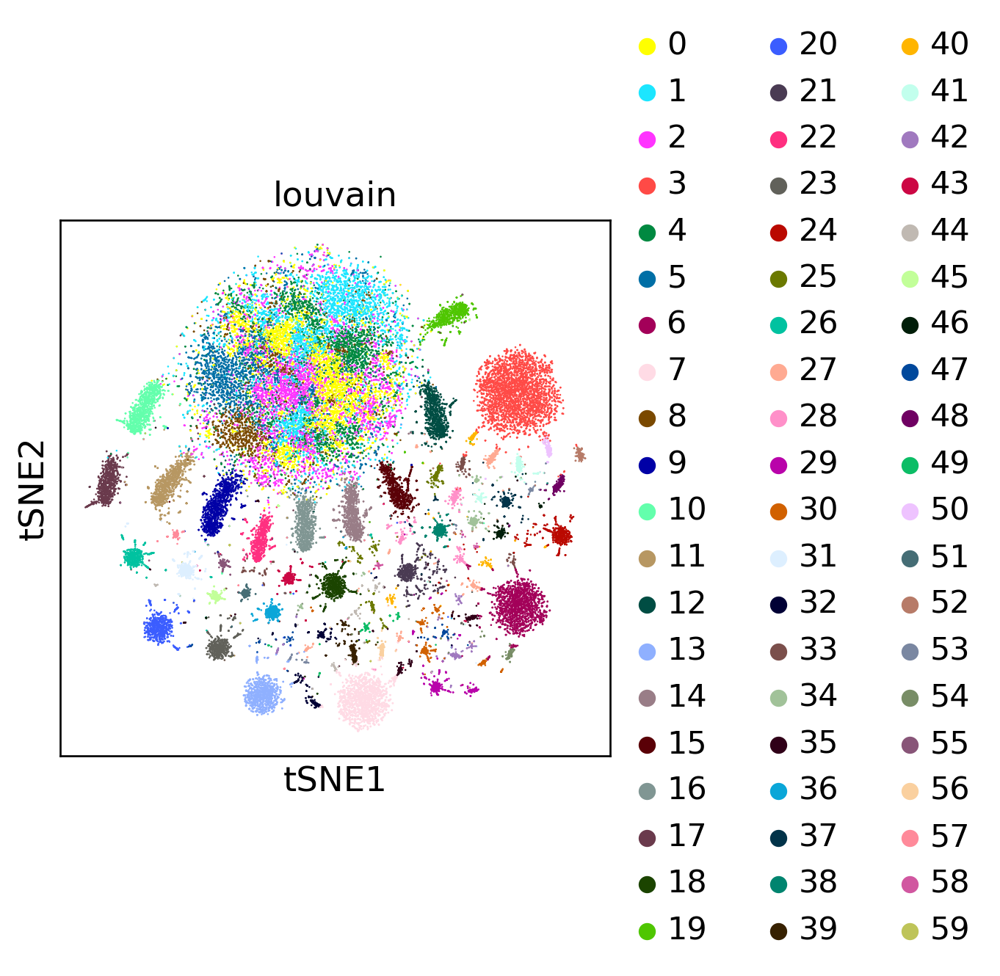

In [ ]:
adata

sc.pp.filter_genes(adata, min_counts=0)
sc.pp.normalize_per_cell(adata, counts_per_cell_after=10000)
adata.obs['n_countslog']=np.log(adata.obs['n_counts'])
sc.pp.log1p(adata)
sc.pp.regress_out(adata, ['n_counts'])
sc.tl.tsne(adata, perplexity=30, use_rep=None)




sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.louvain(adata, resolution=2)
sc.pl.tsne(adata, color='n_countslog')

sc.set_figure_params(dpi=120)
sc.pl.tsne(adata,color=['louvain'])



# sc.pl.tsne(adata, color=adata.var_names)

# for i in range(20):
#     sc.pl.violin(adata[adata.obs['louvain'].isin([str(i)])], keys=adata.var_names)

# sc.pl.tsne(adata, color=['louvain'],palette='rainbow',legend_loc='on data')

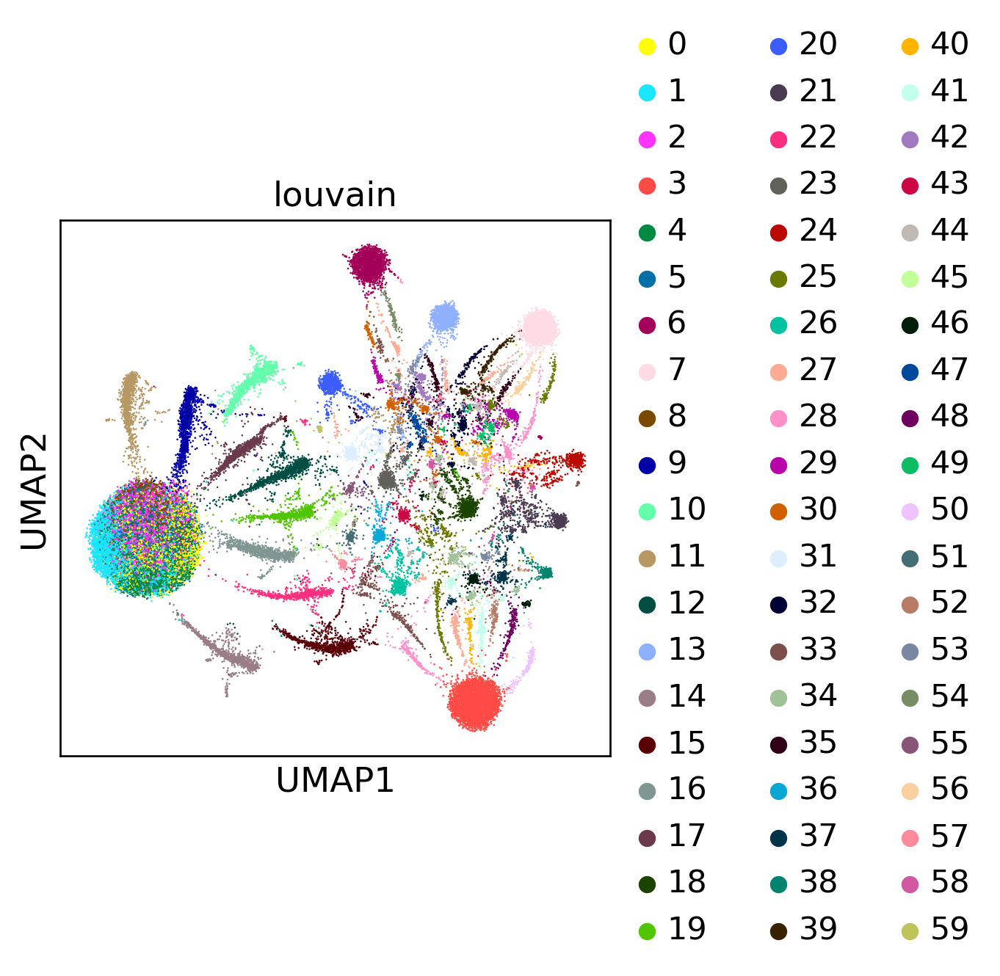

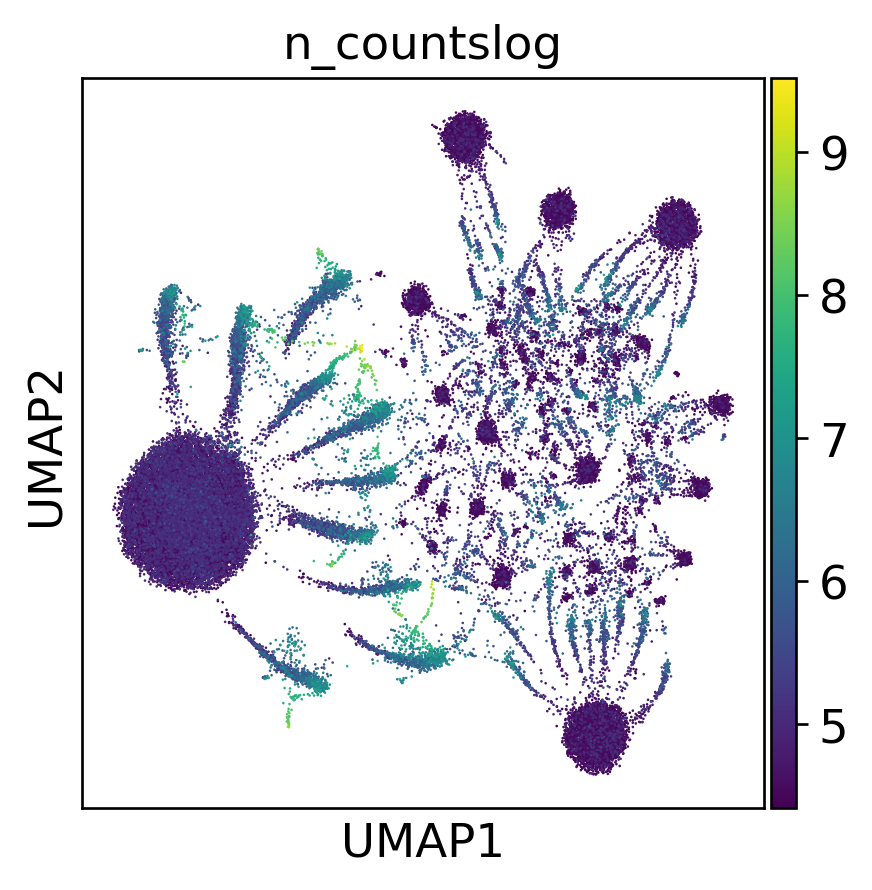

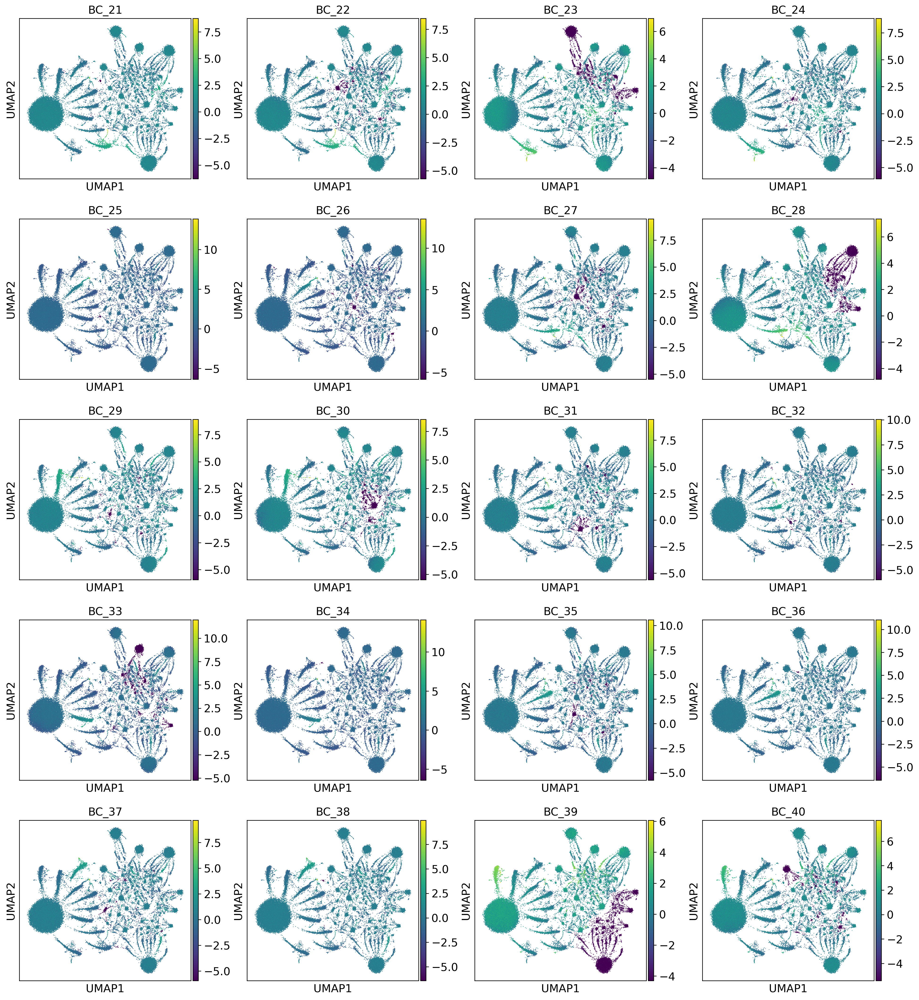

In [ ]:
sc.pl.umap(adata, color='louvain')
sc.pl.umap(adata, color='n_countslog')
sc.pl.umap(adata, color=adata.var_names)

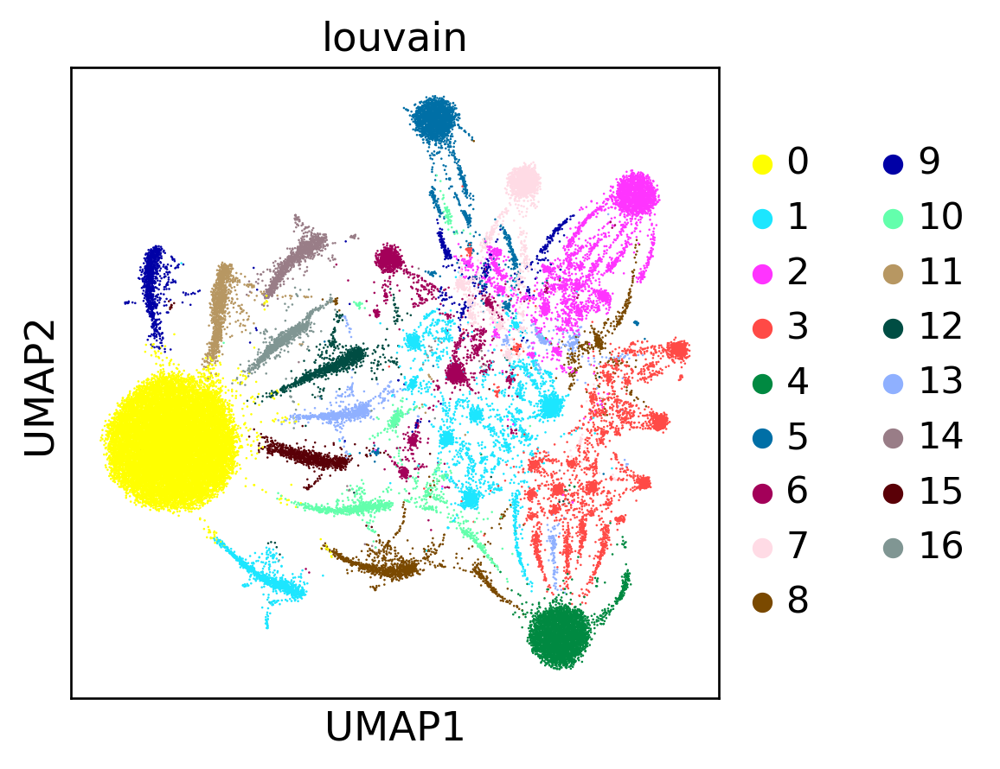

In [ ]:
sc.tl.louvain(adata, resolution=0.15)#0.15
sc.pl.umap(adata, color='louvain')

Select ClickTag Clusters with Clean Expression

In [ ]:
adata_sub = adata[adata.obs['louvain'].isin(['1','8','9','10','11','12','13','14','15','16'])]
adata_sub 
sc.tl.louvain(adata_sub, random_state=42,resolution=0.05, key_added='louvain_new')
sc.tl.umap(adata_sub,random_state = 42,spread=0.5 )

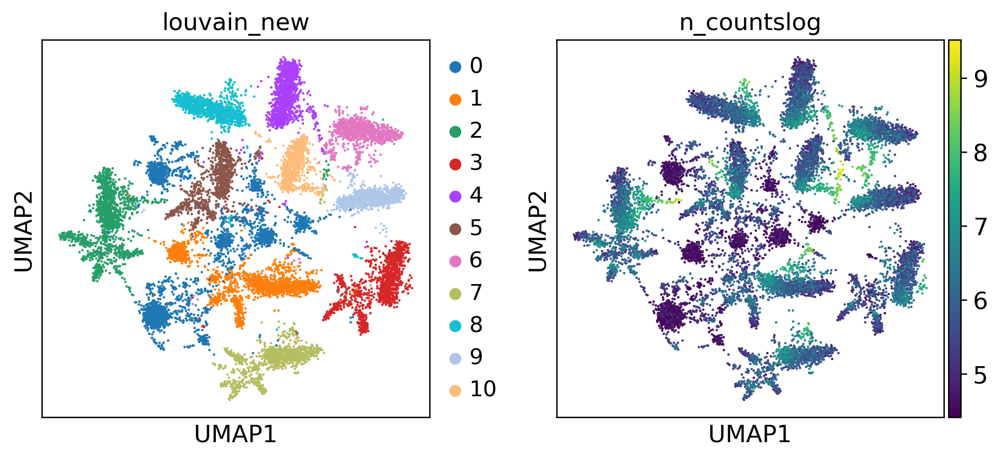

In [ ]:
sc.pl.umap(adata_sub, color=['louvain_new','n_countslog'])

Compare ClickTag Counts/Cell Filtering to Previous Cell Ranger-based Analysis (Found in [this notebook](https://github.com/pachterlab/CWGFLHGCCHAP_2021/blob/master/notebooks/Preprocessing/ClickTagDemultiplexing/cellRangerClickTagCounts.ipynb))

In [ ]:
adata

AnnData object with n_obs × n_vars = 50000 × 20
    obs: 'n_counts', 'n_countslog', 'louvain'
    var: 'n_counts'
    uns: 'log1p', 'neighbors', 'umap', 'louvain', 'louvain_colors'
    obsm: 'X_tsne', 'X_umap'
    obsp: 'distances', 'connectivities'

In [ ]:
adata.obs

,n_counts,n_countslog,louvain
CCATGTCAGTGTTTGC-2,13584.0,9.516648,5
AGGCCGTCAATCGAAA-2,12926.0,9.466996,5
CGCTGGACAAGACGTG-1,11720.0,9.369052,5
CTCGAGGTCACAATGC-1,10908.0,9.297252,5
CACACCTGTCTGATCA-1,9881.0,9.198369,5
...,...,...,...
TGACTAGTCAAACGGG-1,83.0,4.418840,0
CGGACGTAGTAGCGGT-1,83.0,4.418840,0
AACTCTTGTTGCCTCT-1,83.0,4.418840,0
ACGAGGAGTAAGTTCC-1,83.0,4.418840,0


In [ ]:
#Read in clustered, filtered adata from Cell Ranger analysis of Starvation data
!mv D1.1798 D1.1798.h5ad
old=sc.read('D1.1798.h5ad')

In [ ]:
old.obs

,n_counts,n_countslog,louvain,orgID,fed,starved,fed_ord,starved_ord,new_fed,fed_neighbor_score
index,,,,,,,,,,
AAACCTGAGAGGGCTT-1,2188.0,3.340047,10,3,True,False,True,False,True,14
AAACCTGAGAGGTTAT-1,1565.0,3.194514,4,9,False,True,False,True,False,0
AAACCTGAGCGAGAAA-1,342.0,2.534026,3,3,True,False,True,False,True,3
AAACCTGAGCGTGTCC-1,4694.0,3.671543,15,10,False,True,False,True,False,5
AAACCTGAGGATTCGG-1,4876.0,3.688064,3,8,False,True,False,True,False,2
...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGGACGAT-2,2625.0,3.419129,24,4,True,False,True,False,True,8
TTTGTCATCATCTGTT-2,664.0,2.822168,2,7,False,True,False,True,False,8
TTTGTCATCGCCTGAG-2,433.0,2.636488,6,7,False,True,False,True,False,4


In [ ]:
adata['AAACCTGAGAGGGCTT-1'].obs

,n_counts,n_countslog,louvain
AAACCTGAGAGGGCTT-1,258.0,5.552959,13


In [ ]:
adata['AAACCTGAGCGAGAAA-1'].obs

,n_counts,n_countslog,louvain
AAACCTGAGCGAGAAA-1,279.0,5.631212,13


In [ ]:
adata['TTTGTCATCTAACGGT-2'].obs

,n_counts,n_countslog,louvain
TTTGTCATCTAACGGT-2,1815.0,7.503841,13


In [ ]:
counter=0
for x in old[old.obs['orgID']=='2'].obs_names:
  print(adata[x].obs['louvain'][0])
  counter+=1
  if counter==100:break

11
11
11
11
11
1
0
4
2
11
11
11
11
11
1
2
1
11
1
4
2
11
11
11
11
11
1
1
11
1
2
11
1
11
2
11
11
1
11
11
11
1
4
1
11
4
11
2
1
11
11
11
1
4
11
1
2
11
1
11
11
11
11
4
4
11
11
1
2
11
4
1
11
11
11
11
2
11
11
11
1
11
4
11
11
2
1
1
2
11
11
11
11
2
11
0
1
11
11
1


In [ ]:
old[old.obs['orgID']==3]

View of AnnData object with n_obs × n_vars = 0 × 2657
    obs: 'n_counts', 'n_countslog', 'louvain', 'orgID', 'fed', 'starved', 'fed_ord', 'starved_ord', 'new_fed', 'fed_neighbor_score'
    var: 'n_counts', 'n_cells'
    uns: 'fed_ord_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'new_fed_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'starved_ord_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
adata[x].obs['louvain'][0]

'13'

In [ ]:
counter=0
for x in old.obs_names:
  if x not in adata.obs_names:
    print(x)

AACTGGTAGGGAAACA-2
AAGGTTCCACGAAACG-2
ACCTTTATCCGGCACA-2
ACGCCGACAGCTCGCA-2
ATAGACCGTTAAGGGC-2
CCCTCCTCATCGTCGG-2
CCTCAGTCAGGAATGC-2
CGATTGACATACGCTA-2
CGGAGTCGTTTGGCGC-2
CTGGTCTGTCAGAGGT-2
GACAGAGCAAGCCGCT-2
GATCGTATCCATGAAC-2
TACTCATCAAGGTTTC-2
TGGTTAGCATGTCGAT-2
TTAGTTCTCTCCAACC-2
TTTGTCAAGGGCATGT-2


In [ ]:
#ClickTag lane 1 counts estimated from Cell Ranger analysis
jelly1tags=pd.read_csv('D1.1799')
jelly1tags

,Unnamed: 0,ACACCCTGTCATCGGC,CGATTGAGTACTCTCC,GACACGCTCCGAACGC,AGATCTGCAGGACCCT,CGATCGGGTGTCGCTG,CACACCTCATTGTGCA,CTCCTAGCATCTCGCT,CCACTACCATATACGC,ACTATCTCAAGCCGTC,CCACCTACAAATACAG,ATAAGAGCAATTCCTT,CAGAGAGGTACATGTC,AAAGCAAAGAAAGTGG,CAGCTAATCCGTTGCT,AGTGGGAAGATGTGGC,CAGCCGAAGCGATAGC,ATCATCTTCGGAGGTA,GATCGATAGGGTCGAT,CGTGAGCCACAAGCCC,TTGGCAACAGTAAGCG,ACATCAGAGACTGGGT,AGTCTTTTCTACTTAC,CTGGTCTCAAGGTTCT,GTTACAGCAGCGTAAG,AGCTCTCCATCACAAC,TGCTACCGTTAAGGGC,GCGCAACTCATTCACT,TCCCGATCAAGTTCTG,GGGTCTGAGCCTCGTG,GCATACAGTTAGGGTG,TCAGGATGTGGTAACG,CGAATGTGTTGCGCAC,GGGTCTGCACAGACAG,TCACAAGCAGCCAATT,GCGAGAAAGCAGCGTA,CTCACACCATTACCTT,CAGTAACCAATCCGAT,ATCGAGTCATTGGTAC,GTCCTCACATCACAAC,...,GCGCAACGTTATCGGT,AGTGAGGAGCCAGGAT,CGAACATAGGGTATCG,TAGCCGGTCGATGAGG,GACTACAAGCACGCCT,CATGCCTAGAAACGAG,CGAGCCAAGTGTACGG,ACATGGTAGCTAAACA,GTAACGTCAAAGTGCG,ATCCGAACAACACCTA,TAAACCGAGGTGTTAA,GAATGAAAGGCCATAG,AGCGTATCATGCGCAC,CCATGTCAGCTGAACG,TGCGTGGCATAAAGGT,ACTGTCCGTAGAGTGC,GTACGTAAGTTGTAGA,ACAGCCGCATTTCAGG,ATTCTACTCCATGCTC,GGACAAGTCGTTTGCC,TGACAACAGGACATTA,CAAGAAAAGTACGTAA,TGACTTTCATGCAACT,CTTACCGGTGCAGACA,TGACTTTGTGCCTGCA,TGCGCAGCAACCGCCA,GGACATTAGGGCTCTC,ACGATGTGTTAGAACA,TAAACCGTCAACGCTA,TGTGGTATCAACACGT,GTTACAGCACCAGGCT,GTATCTTAGCTGCAAG,GTACGTAGTATATCCG,CGTAGCGTCCTATGTT,TGTCCCAGTCTACCTC,ATGCGATAGATCCCAT,AGTGGGATCTGATACG,TCGGGACGTTTACTCT,TTTGGTTCATGTCTCC,CTTTGCGGTAGTACCT
0,BC_21,0,5,0,1,0,3,7,0,0,4,0,8,0,0,0,4,4,0,5,0,0,0,5,0,0,4,0,0,8,0,0,0,0,1,0,0,0,0,1,...,0,9,0,0,0,0,0,0,0,7,0,0,0,0,0,0,3,3,0,0,0,0,0,2,5,0,0,4,5,0,0,3,0,0,3,9,0,0,0,0
1,BC_22,0,1,0,4,0,1,2,0,0,2,0,7,0,0,0,7,6,0,7,0,0,0,3,0,0,6,0,0,4,0,0,0,0,2,0,1,0,0,0,...,0,3,0,0,0,0,0,0,0,1,0,0,0,0,0,1,2,1,0,0,0,0,1,4,2,0,0,6,9,0,0,1,0,0,7,3,0,0,0,0
2,BC_23,0,1,0,7,0,1,5,0,0,0,0,2,0,0,0,4,2,0,2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,2,0,0,0,0,0,0,4,4,1,0,0,0,0,2,5,0,0,3,1,0,0,5,0,0,0,2,0,0,0,0
3,BC_24,0,6,0,1,0,5,8,0,0,2,0,3,0,0,0,4,4,0,1,0,0,0,1,0,0,7,0,0,3,0,0,0,0,1,0,0,0,0,0,...,0,1,0,1,1,0,0,0,2,7,0,0,0,0,0,0,5,1,0,0,0,0,0,3,11,0,0,4,5,0,0,5,0,0,7,4,1,0,0,0
4,BC_25,0,13,0,6,0,4,2,0,0,9,0,16,0,0,0,8,3,1,6,0,0,0,4,0,0,10,0,0,2,0,0,0,0,2,0,0,0,0,0,...,0,7,0,0,0,0,0,0,0,3,0,0,0,0,0,0,4,5,0,0,0,0,0,6,5,0,0,8,6,0,0,4,0,0,6,7,0,0,0,0
5,BC_26,1,2,0,5,0,5,3,0,0,6,0,7,0,0,0,5,1,0,4,1,0,0,1,0,0,9,0,0,3,0,0,0,0,5,0,0,0,0,0,...,0,5,0,0,0,0,0,0,0,1,0,0,0,0,0,0,5,9,0,0,0,0,0,8,8,0,0,4,3,0,0,8,0,1,2,4,0,1,1,0
6,BC_27,0,4,0,2,0,1,3,0,0,1,0,2,0,0,0,2,1,0,3,0,0,0,0,0,0,5,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,1,1,0,0,0,1,0,0,5,0,0,0,0,0,0,1,4,0,1,0,0,0,2,2,1,0,4,5,0,0,1,0,0,3,3,0,0,0,0
7,BC_28,0,2,0,2,0,0,5,0,0,3,0,4,0,0,0,2,0,0,6,0,0,0,2,0,0,2,0,0,4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,3,1,0,0,0,0,0,2,3,0,0,2,1,0,0,3,0,0,1,1,0,0,0,0
8,BC_29,0,7,1,1,0,1,9,1,0,2,0,7,0,0,0,6,3,0,5,0,0,0,3,1,0,8,0,0,2,0,0,0,0,2,0,0,0,0,0,...,0,3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,6,4,0,0,0,0,0,4,8,0,0,1,5,0,1,4,0,0,6,8,0,0,0,0
9,BC_30,0,4,0,0,0,3,3,0,0,5,0,3,1,0,0,4,1,0,3,0,0,0,0,0,0,1,0,0,2,1,0,0,1,2,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,3,0,0,0,0,0,0,2,1,0,0,0,0,0,1,2,0,0,3,2,0,0,4,0,0,0,5,0,0,0,0


In [ ]:
#ClickTag lane 2 counts estimated from Cell Ranger analysis
jelly2tags=pd.read_csv('D1.1800')
jelly2tags

,Unnamed: 0,GATTCAGAGGCATGGT,GCAGCCAAGTGGGCTA,CTAATGGGTGCTGTAT,CAAGGCCAGAAGGGTA,CGCTTCAGTATCAGTC,AACACGTGTTGCGTTA,CTAGAGTCACCAGGCT,CCATGTCCACAAGCCC,GGCTGGTGTCTCTTAT,TCACAAGCACCCATTC,TTCTACAAGCCTCGTG,GCGAGAACAAGGTTCT,TGGGCGTAGAGTGAGA,AGTTGGTGTGTGGCTC,GCTCCTAGTGATAAGT,GGATTACCAGTATCTG,GGTGCGTCAATGGAAT,ATCCACCCACCAGTTA,TCGAGGCAGCCACTAT,AAACCTGTCCTGTACC,CAGCTAACACGGTAGA,GTTACAGCACAACGTT,CGTGTAACAGTGGAGT,CCTATTATCACCATAG,CGAGAAGGTCGAAAGC,CAAGGCCGTGTGGTTT,CGCTGGACAATCCGAT,GAAATGATCATTATCC,CAGTCCTTCCTTGGTC,TTGCCGTTCGCATGGC,CTCGAGGAGTCATCCA,GGCTCGAGTGCCTGTG,CAGCCGACAGTGGAGT,CACACTCTCTAACCGA,GTGGGTCCACCGCTAG,TCAACGAAGGTCATCT,ACGAGGAGTATCTGCA,CTCACACAGCCTATGT,CGTCTACGTAGAGTGC,...,AAAGCAAAGCGGATCA,CGAGCACAGGGTATCG,TGCGCAGCACAACGTT,TTTCCTCCAGATGGCA,CTCCTAGCAGCATACT,AGCTCCTGTTACGACT,TCAGGATTCCCTCTTT,ATTACTCGTTTGCATG,ATCATGGTCTTGGGTA,GATCAGTAGAACAATC,CAGCTAAGTTTGTGTG,CGTGTCTTCCCTGACT,TCTCTAAGTGGTCCGT,ACGTCAAGTCTTCTCG,CCTAGCTGTTTGTTGG,CTGAAACAGCGATTCT,CGCCAAGTCCACGTTC,GACTACAGTAGGGTAC,GTAGTCAGTAGAAAGG,AGGGTGACAGATGGGT,CCTATTAGTCGCTTCT,CTTCTCTAGCGCCTCA,CCGTACTCACAGACTT,AAACGGGCACTTCGAA,AACCGCGGTCAGTGGA,CTGGTCTTCCATGAAC,CGAGCACAGCCACGTC,CTCTAATGTAAACCTC,ACAGCTAAGGCAAAGA,CTCTACGGTGGTGTAG,TCACGAAGTGAGGGAG,CTGATCCGTCTGCCAG,CTACACCTCCGCGCAA,AAAGCAAGTCCGAGTC,ATTGGTGAGAGACGAA,ATGGGAGAGGCTCATT,CGATCGGCACACCGAC,AGCGTATTCTGTCTCG,CGCGTTTCAGCATACT,ACGCCGACAAGAGTCG
0,BC_21,0,0,0,5,0,0,4,6,0,0,0,0,0,4,11,0,0,4,1,4,0,0,0,0,0,11,9,6,3,5,7,0,0,0,0,0,8,0,0,...,4,0,7,0,0,0,4,1,1,0,0,0,0,0,4,0,0,0,1,1,2,0,8,0,0,8,0,7,0,0,0,0,0,0,0,0,0,1,0,0
1,BC_22,0,1,0,5,0,0,1,4,0,0,0,0,0,2,9,0,0,5,4,1,0,0,0,1,0,2,3,6,5,2,2,0,0,0,0,0,4,0,0,...,3,0,4,0,0,0,3,0,0,1,0,0,0,0,3,0,0,0,0,3,0,0,2,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0
2,BC_23,0,0,0,4,0,0,1,0,0,0,0,0,0,2,1,0,0,2,1,2,0,0,0,0,0,6,2,1,4,0,0,0,0,0,0,0,3,0,0,...,2,0,3,0,0,1,1,0,0,0,0,0,0,0,3,0,0,1,0,4,1,1,1,1,1,3,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,BC_24,0,0,0,0,0,0,4,4,0,1,0,0,1,4,2,0,0,10,3,6,0,0,0,0,0,6,4,4,2,7,6,0,0,0,0,0,4,0,0,...,1,0,2,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,6,0,0,4,0,3,0,0,0,0,0,0,0,0,0,0,0,0
4,BC_25,0,0,0,6,0,0,9,3,0,0,0,0,0,3,5,0,0,5,4,7,1,0,0,0,0,8,7,8,1,3,3,0,0,0,1,0,3,0,1,...,4,0,2,1,0,0,8,0,0,0,0,0,0,0,6,0,0,0,0,2,6,0,12,0,0,6,0,8,0,0,0,0,0,1,0,0,0,0,1,0
5,BC_26,0,0,0,5,0,0,2,1,0,0,0,0,0,3,7,0,0,3,6,5,0,0,0,0,0,6,3,8,4,9,1,0,0,0,0,0,2,0,0,...,3,0,2,0,1,0,4,0,0,0,0,0,0,1,4,0,0,0,0,2,2,0,1,0,0,3,0,2,0,0,1,0,0,0,0,0,0,0,0,0
6,BC_27,0,0,0,5,0,0,2,2,0,0,1,0,0,0,1,0,0,1,5,5,0,0,0,0,0,5,4,7,3,3,4,0,0,0,0,0,3,0,0,...,4,0,3,0,0,0,5,0,0,0,0,0,0,0,3,0,0,0,1,4,1,0,2,0,0,2,1,4,0,0,0,0,0,0,0,0,0,0,0,0
7,BC_28,0,0,0,2,0,0,0,0,0,0,0,0,0,3,2,0,0,2,0,0,0,0,0,0,0,2,2,4,2,3,2,0,0,0,0,0,2,0,0,...,2,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,2,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0
8,BC_29,0,0,0,4,0,0,6,4,1,0,0,1,0,2,7,0,0,4,2,4,0,0,0,0,0,5,5,8,6,6,2,0,0,0,0,0,1,0,0,...,8,0,3,0,0,0,2,0,0,0,0,0,0,0,4,0,0,0,0,5,4,0,7,0,0,3,0,3,0,0,0,1,1,0,0,0,0,0,0,0
9,BC_30,0,0,0,3,1,0,2,3,0,0,0,0,0,1,2,0,0,2,2,4,0,0,0,0,0,5,1,2,3,3,5,0,0,1,0,1,4,0,0,...,4,0,1,0,0,0,2,0,0,0,0,0,0,0,2,1,0,0,0,1,4,0,4,0,0,3,0,5,0,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
jelly2tags['CCATGTCAGTGTTTGC']

0       77
1       39
2       15
3       75
4     7114
5     5928
6       35
7       45
8       45
9       25
10      45
11      51
12      27
13      49
14      23
15      53
16      38
17      55
18      20
19      28
Name: CCATGTCAGTGTTTGC, dtype: int64

In [ ]:
adata['CCATGTCAGTGTTTGC-2'].X

ArrayView([[ 7.832645 ,  6.9506545,  6.153693 ,  8.8333645, 13.878383 ,
            13.557319 ,  9.487391 ,  7.2928925,  7.6783485,  6.5176826,
             7.2424545,  8.551719 ,  7.2883577,  9.619349 ,  6.4227967,
             7.5293713,  8.727089 ,  9.155742 ,  5.0387535,  7.7183394]],
          dtype=float32)

In [ ]:
ClickTag_counts_filtered.T['CCATGTCAGTGTTTGC-2']

BC_21      73
BC_22      40
BC_23      14
BC_24      74
BC_25    6992
BC_26    5863
BC_27      36
BC_28      45
BC_29      41
BC_30      25
BC_31      43
BC_32      50
BC_33      26
BC_34      48
BC_35      24
BC_36      50
BC_37      38
BC_38      56
BC_39      19
BC_40      27
Name: CCATGTCAGTGTTTGC-2, dtype: int64

In [ ]:
ClickTag_counts_filtered

,BC_21,BC_22,BC_23,BC_24,BC_25,BC_26,BC_27,BC_28,BC_29,BC_30,BC_31,BC_32,BC_33,BC_34,BC_35,BC_36,BC_37,BC_38,BC_39,BC_40
CCATGTCAGTGTTTGC-2,73,40,14,74,6992,5863,36,45,41,25,43,50,26,48,24,50,38,56,19,27
AGGCCGTCAATCGAAA-2,35,23,18,36,52,25,30,18,33,29,47,26,4530,7795,46,58,25,43,26,31
CGCTGGACAAGACGTG-1,30,28,20,24,36,38,14,42,18,34,16,43,15,30,5000,6260,18,32,8,14
CTCGAGGTCACAATGC-1,35,19,53,135,41,23,20,14,34,35,51,36,4344,5855,29,54,33,47,15,35
CACACCTGTCTGATCA-1,72,37,14,58,5111,3898,31,51,31,23,33,25,137,199,27,32,33,32,18,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGACTAGTCAAACGGG-1,7,6,1,4,8,1,5,4,8,4,2,5,1,6,4,4,5,4,3,1
CGGACGTAGTAGCGGT-1,7,6,3,5,5,5,2,1,8,4,2,4,4,6,6,5,3,1,3,3
AACTCTTGTTGCCTCT-1,5,5,3,4,4,3,5,1,10,3,3,4,3,5,2,7,4,9,1,2
ACGAGGAGTAAGTTCC-1,10,5,3,5,6,2,5,1,3,3,3,5,1,4,3,7,7,4,4,2


In [ ]:
ClickTag_counts_filtered.T.sum()

CCATGTCAGTGTTTGC-2    13584
AGGCCGTCAATCGAAA-2    12926
CGCTGGACAAGACGTG-1    11720
CTCGAGGTCACAATGC-1    10908
CACACCTGTCTGATCA-1     9881
                      ...  
TGACTAGTCAAACGGG-1       83
CGGACGTAGTAGCGGT-1       83
AACTCTTGTTGCCTCT-1       83
ACGAGGAGTAAGTTCC-1       83
GGGAATGAGCGTTGCC-2       83
Length: 50000, dtype: int64

In [ ]:
old.obs_names[:][:]

Index(['AAACCTGAGAGGGCTT-1', 'AAACCTGAGAGGTTAT-1', 'AAACCTGAGCGAGAAA-1',
       'AAACCTGAGCGTGTCC-1', 'AAACCTGAGGATTCGG-1', 'AAACCTGCAAAGTGCG-1',
       'AAACCTGCAAGCTGGA-1', 'AAACCTGCAATCACAC-1', 'AAACCTGCATAACCTG-1',
       'AAACCTGCATGCAACT-1',
       ...
       'TTTGTCACACTTAACG-2', 'TTTGTCAGTACCTACA-2', 'TTTGTCAGTATGGTTC-2',
       'TTTGTCAGTCATTAGC-2', 'TTTGTCAGTCTCCACT-2', 'TTTGTCAGTGGACGAT-2',
       'TTTGTCATCATCTGTT-2', 'TTTGTCATCGCCTGAG-2', 'TTTGTCATCTAACGGT-2',
       'TTTGTCATCTGAGTGT-2'],
      dtype='object', name='index', length=13673)

In [ ]:
counter=0
for x in old.obs_names[:]:
  if x[-1]=='2':
    print(counter)
    break
  counter+=1

6853


In [ ]:
old.obs_names[6850:6860]

Index(['TTTGTCAGTGTGAAAT-1', 'TTTGTCAGTTCCACAA-1', 'TTTGTCATCCGGGTGT-1',
       'AAACCTGAGCAGCGTA-2', 'AAACCTGAGCTGAACG-2', 'AAACCTGCAAGCCATT-2',
       'AAACCTGCAGGGAGAG-2', 'AAACCTGCATGAGCGA-2', 'AAACCTGGTCTGCCAG-2',
       'AAACCTGTCAATCTCT-2'],
      dtype='object', name='index')

In [ ]:
kallistocounts=[]
cellrangercounts=[]
counter=0
for x in old.obs_names[:6853]:
  kallistocounts+=[ClickTag_counts_filtered.T[x]]
  cellrangercounts+=[jelly1tags[x[:-2]]]
  counter+=1

In [ ]:
counter

6853

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  


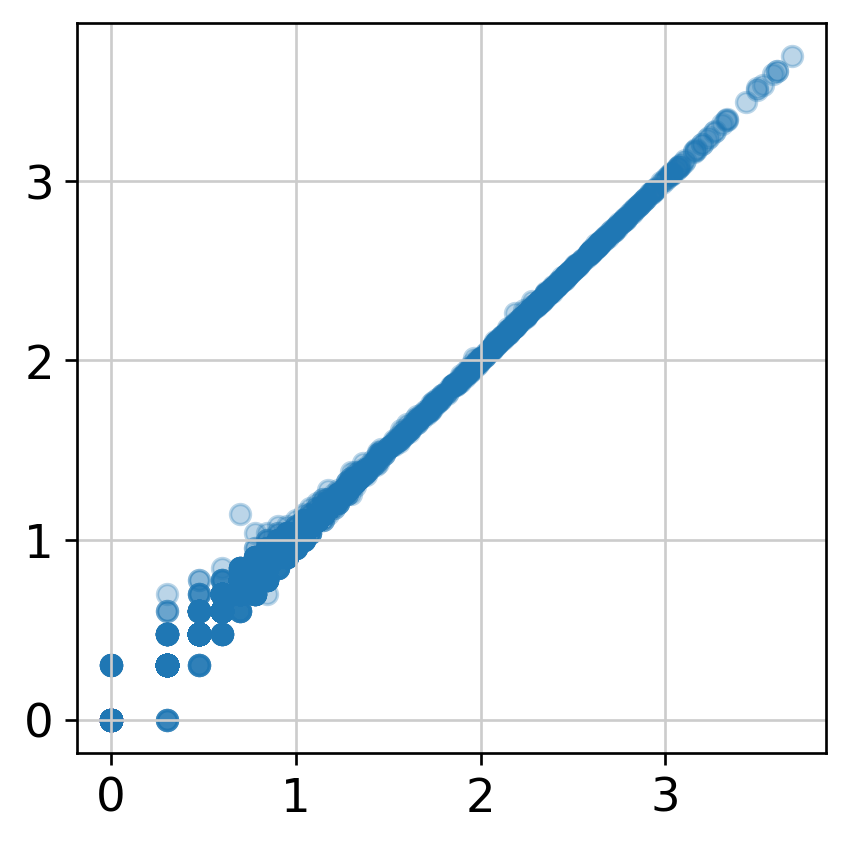

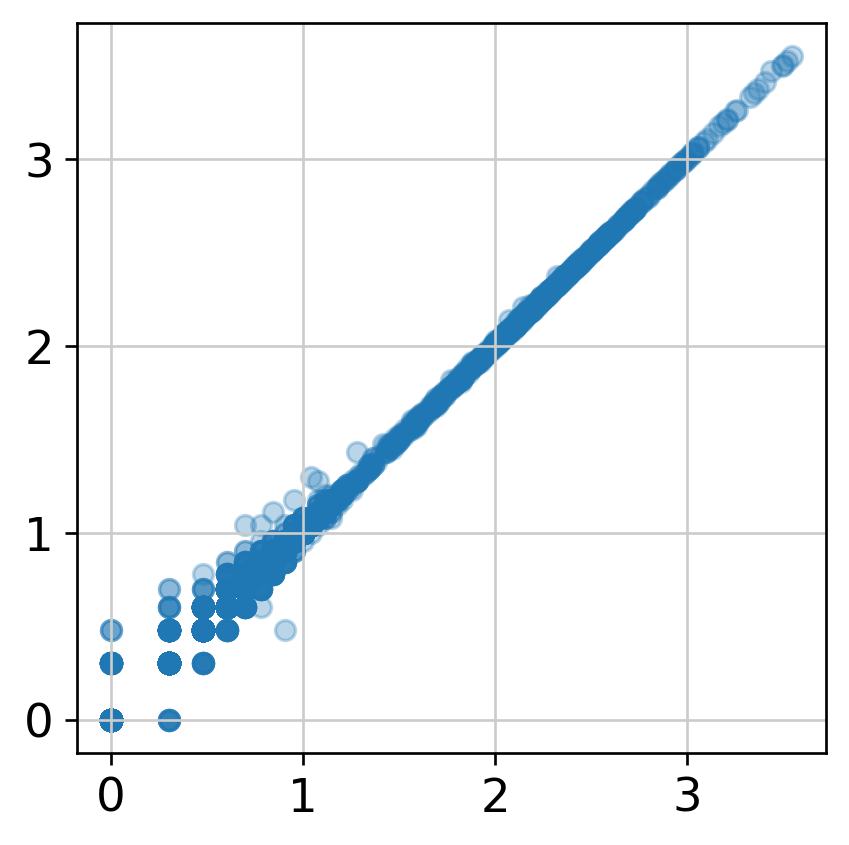

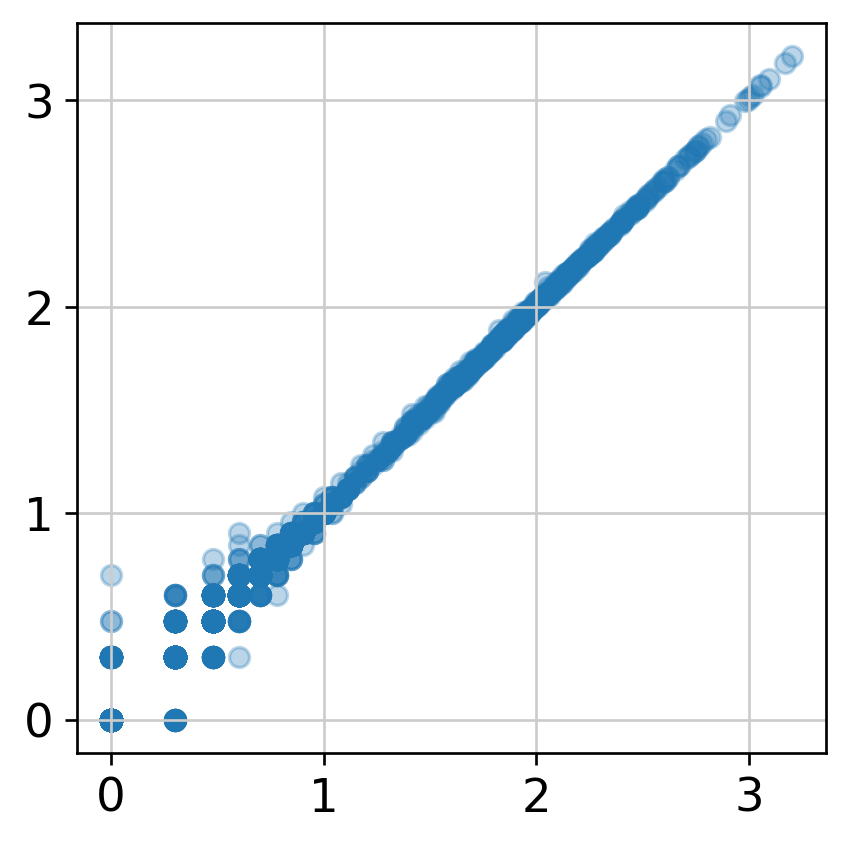

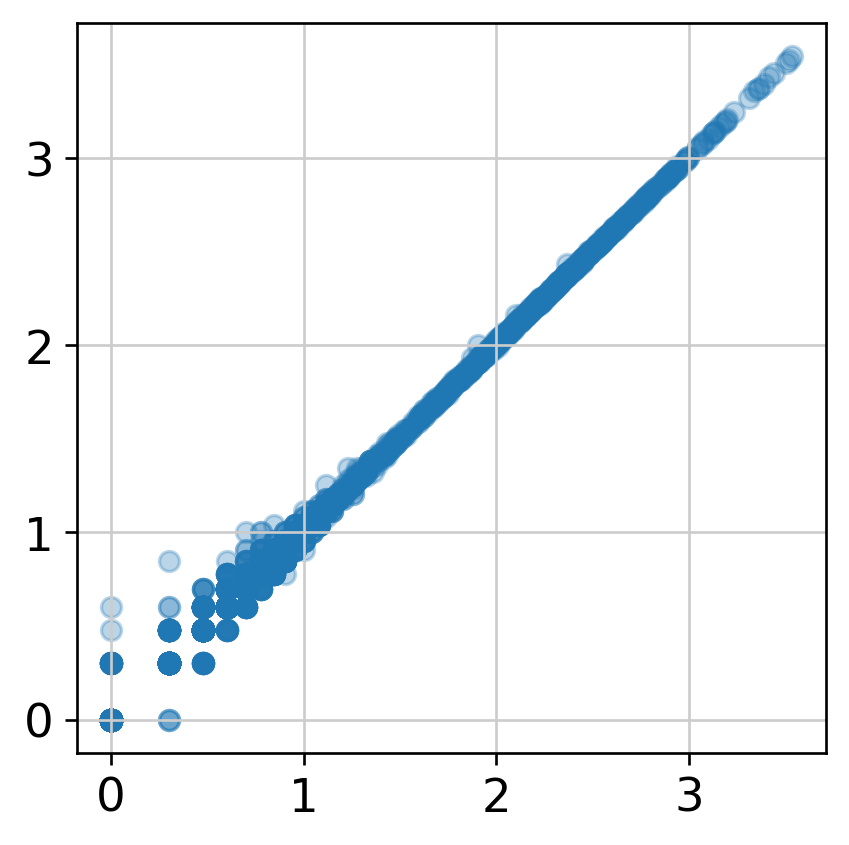

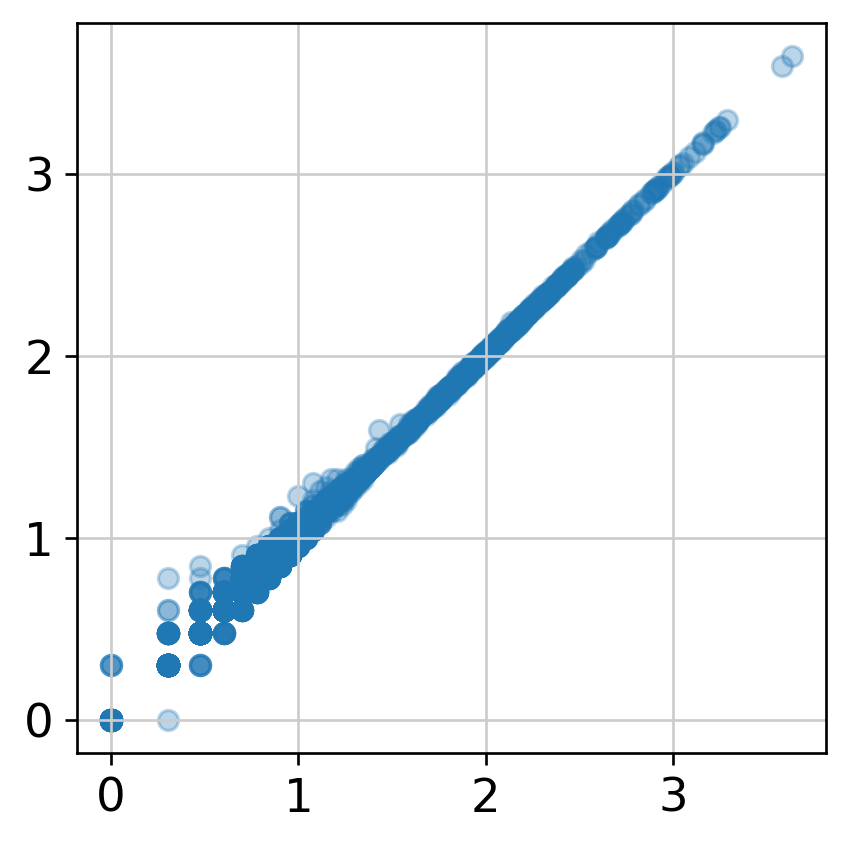

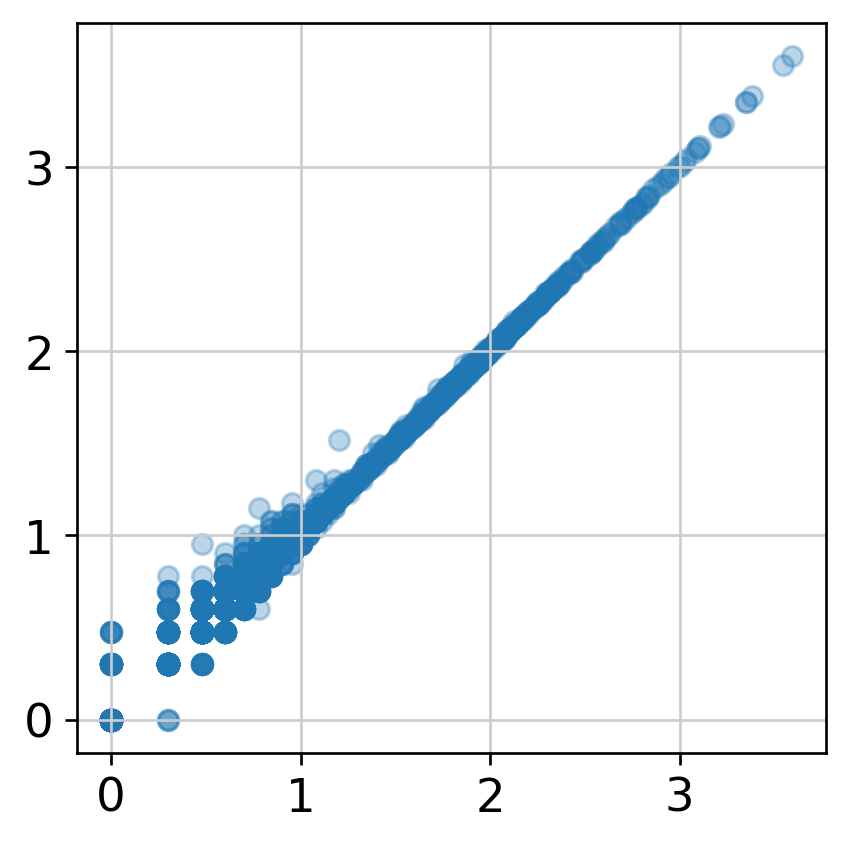

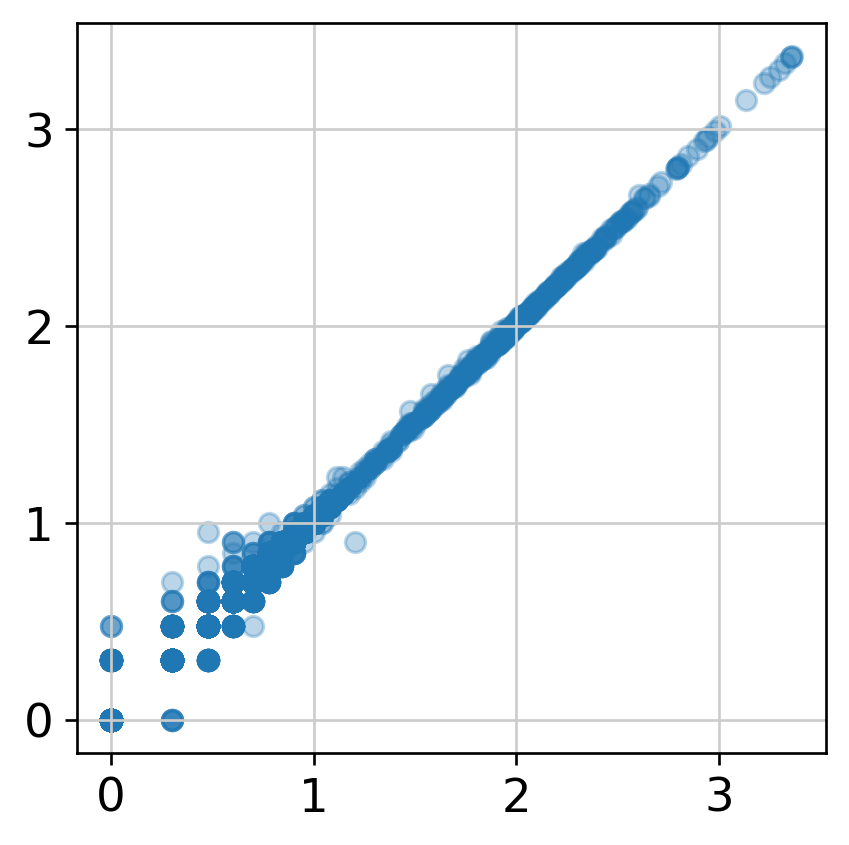

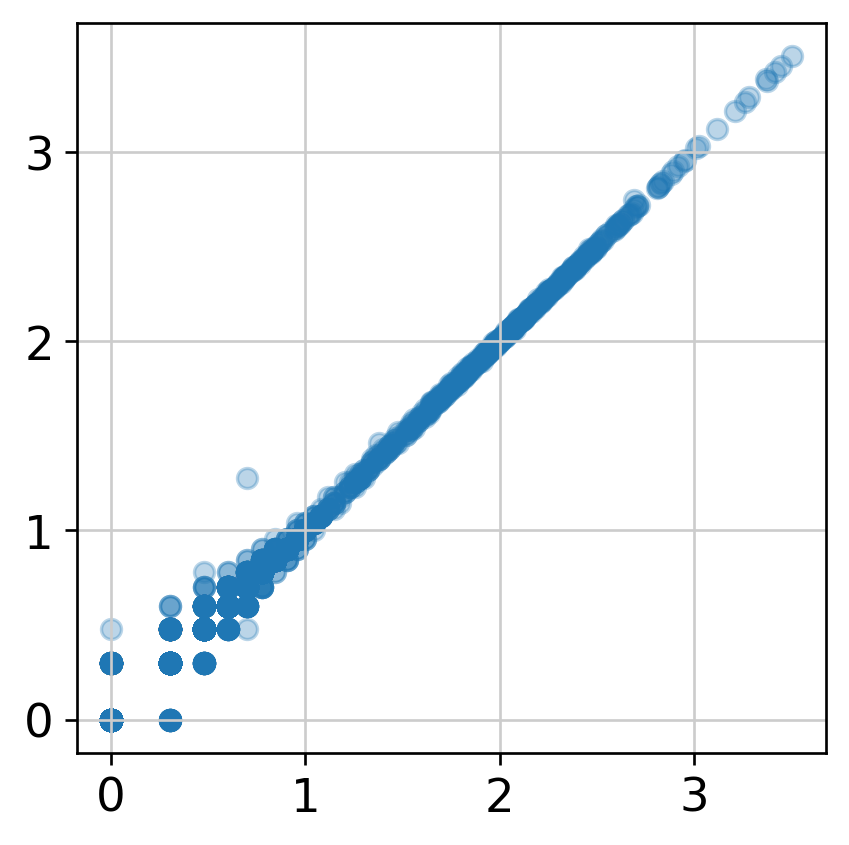

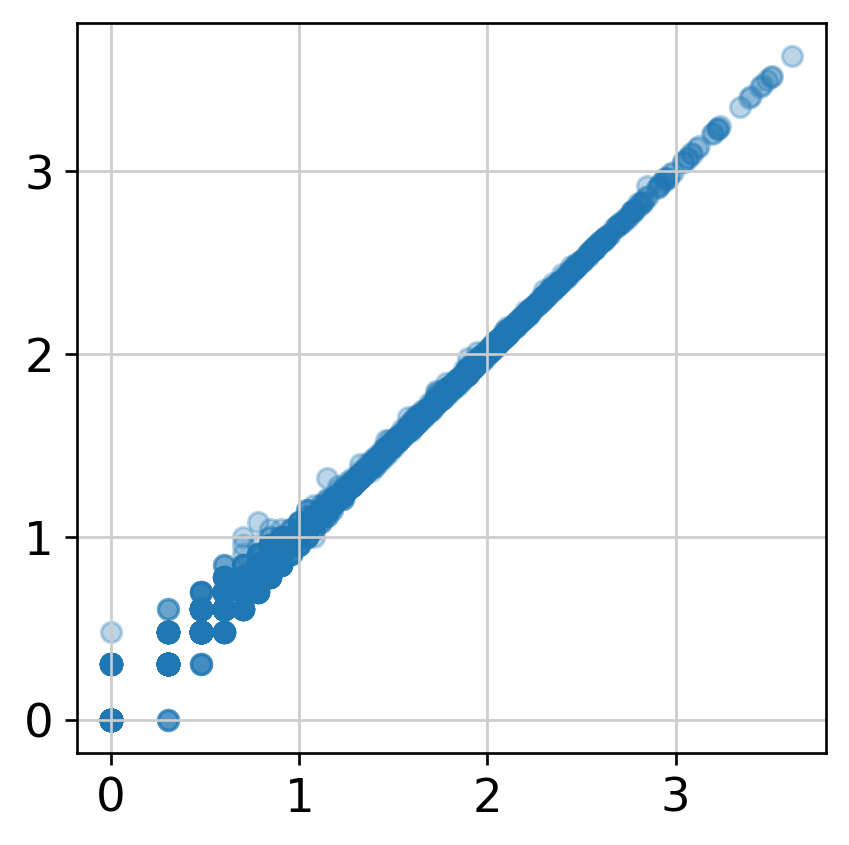

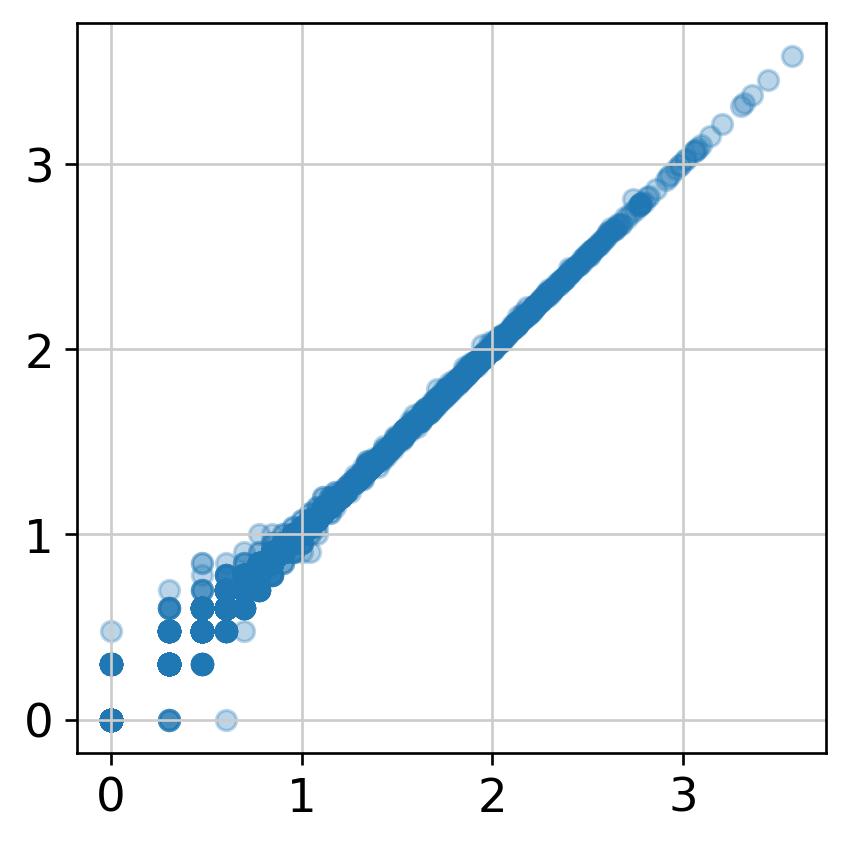

In [ ]:
for tag in list(range(10)):
  plt.scatter(np.log10([x[tag] for x in kallistocounts]), np.log10([x[tag] for x in cellrangercounts]), alpha=0.3)
  plt.show()